<a href="https://colab.research.google.com/github/song7sonne/deep-learning-for-image-processing/blob/master/0413.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive')
dl_path="/content/drive/MyDrive/"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
data_path = "/content/drive/MyDrive/smo/"
avi_filename = "20200609_134211.avi"
import cv2
import numpy as np
#read the movie 
cap = cv2.VideoCapture(data_path + avi_filename)
nframes = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
print(nframes)

442


In [4]:
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = cap.get(cv2.CAP_PROP_FPS)
print(width,height,fps)

1920 1080 30.0


In [5]:
from matplotlib import pyplot as plt
# from google.colab.patches import cv2_imshow
from IPython.display import clear_output
swidth,sheight = width//2,height//2
cap = cv2.VideoCapture(data_path + avi_filename)
ret,ima = cap.read()
ima = cv2.cvtColor(ima, cv2.COLOR_BGR2GRAY)

ima = cv2.resize(ima,(swidth,sheight))

#prepare blank array for the movie show
ims = []
flows = []
for i in range(nframes -1):
  ret,imb = cap.read()
  imb = cv2.cvtColor(imb, cv2.COLOR_BGR2GRAY)
  imb = cv2.resize(imb,(swidth,sheight))
  #optical flow 
  #prvs and next(imab,imb) are the two frames used to calculate the flow 
  #None: An initial estimate of the optical flow result. This is not required, but can be set to None for code compatibility.
  #0.5: Pyramid scaling factor. The default value is 0.5, indicating that the size ratio of each two adjacent layers of pyramid image is 0.5.
  #3: Number of pyramid layers. The default value is 3.
  #Window size, represents the window size of neighborhood pixel points used in the calculation of optical flow.
  #3: number of iterations, representing the number of iterations of each pixel point in the calculation of optical flow.
  #5: Size of Gaussian filter used in optical flow algorithm.
  #1.2: optical flow smoothing factor. The default value is 1.2.
  #•0: Optional parameter used in the optical flow algorithm, indicating whether the polar coordinate method is used to represent
  #the optical flow quantity during calculation. Generally, it does not need to be specified.
  #For the sake of code compatibility, the value can be 0.
  flow = cv2.calcOpticalFlowFarneback(ima,imb,flow=None,
                     pyr_scale=0.5,levels=3,
                     winsize=7,iterations=3,poly_n=5,
                     poly_sigma=1.1,flags=0)
  flows.append(flow)#store the flow
  ims.append(ima) 
  ima = imb#Cycle on make all frames of the video do optical flow arithmetic


In [6]:
print ("flow.shape",flow.shape)
print ("ima.shape",ima.shape)


flow.shape (540, 960, 2)
ima.shape (540, 960)


In [7]:
print (len(ims))

441


In [8]:
from matplotlib import animation, rc
from IPython.display import HTML

plts = []
fig = plt.figure()#creates a new matplotlib graphics window object
for im in ims: 
  plts.append([plt.imshow(im, cmap='gray', vmin=0, vmax=255)])
#for im in ims[:10]: plt.imshow(im, cmap='gray'); plt.show()
anim_avi = animation.ArtistAnimation(fig, plts, interval=100, blit=True)
plt.rcParams['animation.ffmpeg_path'] = '/usr/bin/ffmpeg'
plt.close(anim_avi._fig)

HTML(anim_avi.to_html5_video())

In [9]:
from matplotlib import animation,rc
from IPython.display import HTML

hsv = np.zeros((sheight,swidth,3),dtype = "uint8")
hsv[...,2] = 255 #set the background to white
#hsv = cv2.resize(hsv,(swidth,sheight))

plts = []
fig = plt.figure()
for flow in flows:
  mag,ang = cv2.cartToPolar(flow[...,0],flow[...,1])
  #flow[..., 0] is the displacement in the x direction in the optical flow field, mag mag is the magnitude.
  #flow[..., 1] is the displacement in the y direction in the optical flow field. ang ang is for angle.
  hsv[...,0]=ang*180/np.pi/2
  hsv[...,1]=mag*64
  rgb = cv2.cvtColor(hsv,cv2.COLOR_HSV2RGB)
  plts.append([plt.imshow(rgb)])
anim_flow = animation.ArtistAnimation(fig, plts, interval=100, blit=True)
plt.rcParams['animation.ffmpeg_path'] = '/usr/bin/ffmpeg'
plt.close(anim_flow._fig)

HTML(anim_flow.to_html5_video())

In [10]:
%matplotlib inline
HTML(anim_avi.to_html5_video() + anim_flow.to_html5_video())
#HTML(anim_avi.to_html5_video())
#HTML(anim_flow.to_html5_video())


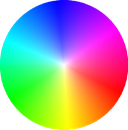

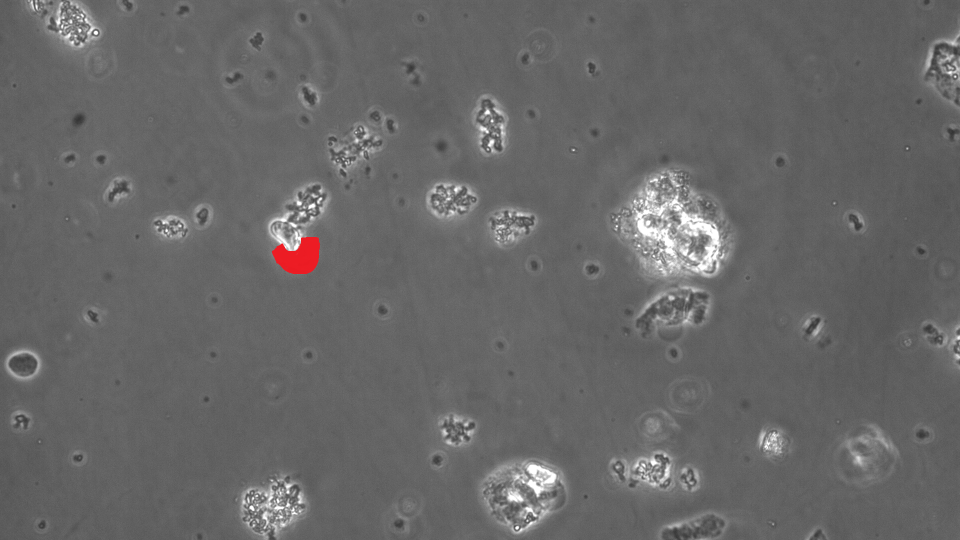

mask1.shape (540, 960)
imsk.shape (540, 960, 3)
grid_HSV.shape (540, 960, 3)
ims[0].shape (540, 960)


In [11]:
from matplotlib import animation, rc
from IPython.display import HTML
from google.colab.patches import cv2_imshow
imsk_filename = "masked.png"
imsk = cv2.imread(data_path + imsk_filename)
imsk = cv2.resize(imsk,(swidth,sheight))
cv2_imshow(imsk)
grid_HSV = cv2.cvtColor(imsk,cv2.COLOR_BGR2HSV)
# H, S, V range one：
lower1 = np.array([156,43,46])
upper1 = np.array([180,255,255])
mask1 = cv2.inRange(grid_HSV, lower1, upper1)
print ("mask1.shape",mask1.shape)
print ("imsk.shape",imsk.shape)
print ("grid_HSV.shape",grid_HSV.shape)
print ("ims[0].shape",ims[0].shape)
plts = []
fig = plt.figure()
for im in ims:
  im = cv2.bitwise_and(im,im, mask=mask1)
  plts.append([plt.imshow(im, cmap='gray', vmin=0, vmax=255)])
  #plts.append(res)
  #for im in ims[:10]: plt.imshow(im, cmap='gray'); plt.show()
anim_avi_mskd = animation.ArtistAnimation(fig, plts, interval=33, blit=True)
plt.rcParams['animation.ffmpeg_path'] = '/usr/bin/ffmpeg'
plt.close(anim_avi_mskd._fig)

HTML(anim_avi_mskd.to_html5_video())


In [12]:
plts = []
fig = plt.figure()
for flow in flows:
  mag,ang = cv2.cartToPolar(flow[...,0],flow[...,1])
  #flow[..., 0] is the displacement in the x direction in the optical flow field, mag mag is the magnitude.
  #flow[..., 1] is the displacement in the y direction in the optical flow field. ang ang is for angle.
  hsv[...,0]=ang*180/np.pi/2
  hsv[...,1]=mag*64
  rgb = cv2.cvtColor(hsv,cv2.COLOR_HSV2RGB)
  rgb = cv2.bitwise_and(rgb,rgb, mask=mask1)
  plts.append([plt.imshow(rgb)])
anim_flow = animation.ArtistAnimation(fig, plts, interval=100, blit=True)
plt.rcParams['animation.ffmpeg_path'] = '/usr/bin/ffmpeg'
plt.close(anim_flow._fig)

HTML(anim_flow.to_html5_video())

In [13]:
angle_list=[]
imc=cv2.cvtColor(ima, cv2.COLOR_GRAY2BGR)
print ("ima.shape",ima.shape)
print ("imc.shape",imc.shape)
hsv = np.zeros_like(imc)
hsv[..., 1] = 255


ima.shape (540, 960)
imc.shape (540, 960, 3)


In [17]:
plt2 = []
fig = plt.figure()
pickp = 0 
for flow in flows:
    blank = np.full((540,960,3), 255, dtype=np.uint8)
    mag, ang = cv2.cartToPolar(flow[...,0], flow[...,1])
    hsv[...,0] = ang*180/np.pi/2
    hsv[...,2] = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX)
    bgr = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    a = []
    b = []
    for y in range(0, sheight, 5):
        for x in range(0, swidth, 5):
            if mask1[y, x] > 0:
                fx, fy = flow[y, x]
                a.append(y)
                b.append(x)
                c = tuple(map(int, bgr[y, x]))
                cv2.arrowedLine(blank,(x,y),(int(x+fx),int(y+fy)),c,1)
                mag2,ang2=cv2.cartToPolar(np.array([fx]),np.array([fy]),angleInDegrees=True)
                #for c,d in zip(a,b):
                #mag2,ang2=cv2.cartToPolar(flow[a,b,0],flow[a,b,1],angleInDegrees=True)
                ang2=int(ang2)
                angle_list.append(ang2)
    
    plt2.append([plt.imshow(blank)])
pickp = len(a)
print("The number of pixels picked",len(a))
anim_blank = animation.ArtistAnimation(fig, plt2, interval=100, blit=True)
plt.rcParams['animation.ffmpeg_path'] = '/usr/bin/ffmpeg'
plt.close(anim_blank._fig)
HTML(anim_blank.to_html5_video())


The number of pixels picked 48


In [19]:
txt_filename="angle_0413"
with open(data_path+txt_filename, 'w') as f:
    for a in angle_list:
        f.write(str(round(a)) + '\n')

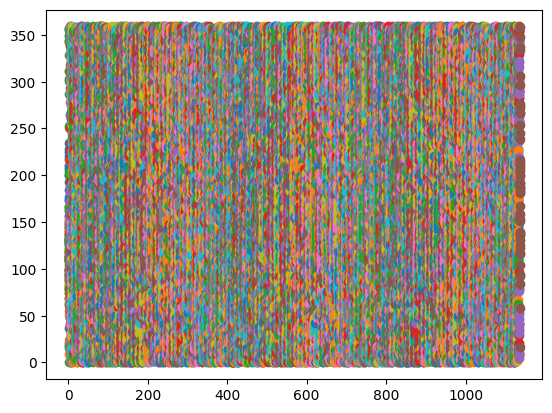

In [21]:
group_size = 48
groups = []

# 逐行读取数据并分组
with open(data_path+txt_filename, 'r') as f:
    group = []
    for i, line in enumerate(f):
        group.append(int(line.strip()))
        if len(group) == group_size:
            groups.append(group)
            group = []
    # 如果文件不是刚好包含整数个组，则最后一组不足 group_size 个元素，需要特别处理
    if group:
        groups.append(group)

# 绘制散点图
for i, group in enumerate(groups):
    x = [i + 1] * len(group)
    y = group
    plt.scatter(x, y)

# 显示图形
plt.show()

group 0
groups 50


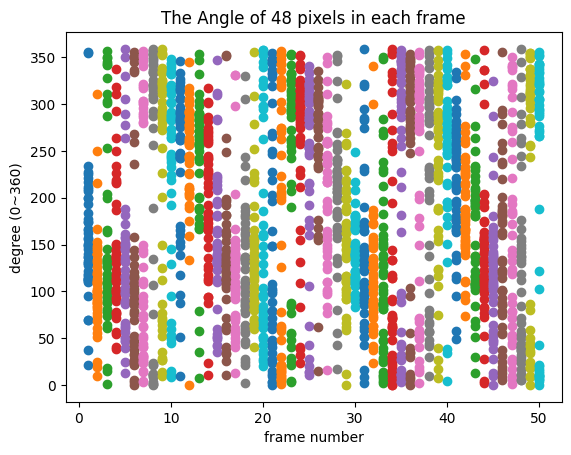

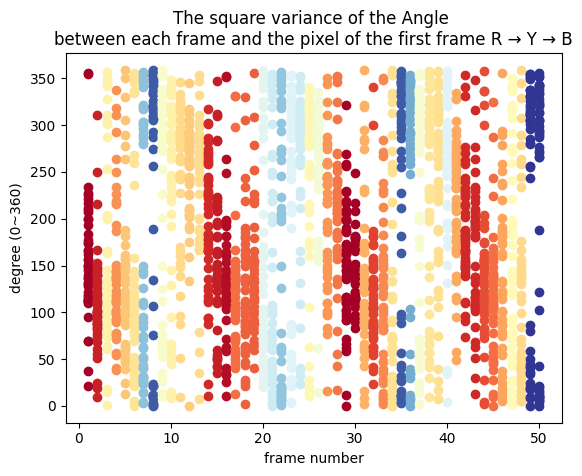

In [24]:
plotsave_filename="square_varianceRYB.jpeg"
group_size = 48
num_lines = 2400
groups = []

with open(data_path+txt_filename, 'r') as f:
    count = 0
    group = []
    for line in f:
        count += 1
        if count > num_lines:
            break
        group.append(int(line.strip()))
        if len(group) == group_size:
            groups.append(group)
            group = []
    if group:
        groups.append(group)
print ("group",len(group))#the number of pixel in group
print ("groups",len(groups))#the number of frame

    
for i, group in enumerate(groups):
    x = [i + 1] * len(group)
    y = group#frame 
    plt.scatter(x, y)
plt.title("The Angle of 48 pixels in each frame")    
plt.xlabel("frame number")
plt.ylabel("degree (0~360)")    
plt.show()
#-------------------------------
first_group = groups[0]  # 获取第一个group
results = []
for i, group in enumerate(groups):
    diff = [(x - y)**2 for x, y in zip(group, first_group)]  # 获取对应位置的差值平方
    diff_sum = sum(diff)  # 求和
    results.append(int(diff_sum/48))

# 计算颜色映射关系
color_map = plt.get_cmap('RdYlBu')
sorted_results = sorted(results)
vmin = sorted_results[2]
vmax = np.max(results)
normalized_results = [(x - vmin) / (vmax - vmin) for x in results]
colors = [color_map(x) for x in normalized_results]

# 绘制散点图并上色
for i, group in enumerate(groups):
    x = [i + 1] * len(group)
    y = group  # frame
    plt.scatter(x, y, color=colors[i])
plt.title("The square variance of the Angle \nbetween each frame and the pixel of the first frame R → Y → B")    
plt.xlabel("frame number")
plt.ylabel("degree (0~360)")
plt.savefig(data_path + plotsave_filename,dpi=300)      
plt.show()

In [25]:
my_list = results
tuple_list = [(i, x) for i, x in enumerate(my_list)]  # 将序号和值组成元组列表
sorted_list = sorted(tuple_list, key=lambda x: x[1])  # 根据值排序
for i, item in enumerate(sorted_list):
    print(f"{i+1}. 序号: {item[0]}, 值: {item[1]}")

1. 序号: 0, 值: 0
2. 序号: 29, 值: 4135
3. 序号: 28, 值: 5438
4. 序号: 15, 值: 6195
5. 序号: 14, 值: 7107
6. 序号: 1, 值: 7342
7. 序号: 42, 值: 7640
8. 序号: 41, 值: 7706
9. 序号: 13, 值: 7744
10. 序号: 31, 值: 8853
11. 序号: 43, 值: 9362
12. 序号: 18, 值: 10018
13. 序号: 17, 值: 10116
14. 序号: 44, 值: 10588
15. 序号: 16, 值: 10660
16. 序号: 27, 值: 11046
17. 序号: 32, 值: 11771
18. 序号: 3, 值: 12179
19. 序号: 26, 值: 12249
20. 序号: 45, 值: 12831
21. 序号: 40, 值: 13044
22. 序号: 30, 值: 13366
23. 序号: 4, 值: 14330
24. 序号: 11, 值: 14698
25. 序号: 47, 值: 15480
26. 序号: 10, 值: 15489
27. 序号: 12, 值: 15650
28. 序号: 38, 值: 15816
29. 序号: 33, 值: 15967
30. 序号: 5, 值: 16048
31. 序号: 37, 值: 16301
32. 序号: 2, 值: 17198
33. 序号: 9, 值: 17218
34. 序号: 24, 值: 17758
35. 序号: 46, 值: 17894
36. 序号: 8, 值: 18942
37. 序号: 36, 值: 19137
38. 序号: 25, 值: 19374
39. 序号: 19, 值: 20629
40. 序号: 22, 值: 20867
41. 序号: 39, 值: 20953
42. 序号: 20, 值: 21693
43. 序号: 23, 值: 21711
44. 序号: 21, 值: 24689
45. 序号: 6, 值: 24831
46. 序号: 35, 值: 26098
47. 序号: 7, 值: 29680
48. 序号: 34, 值: 29735
49. 序号: 49, 值: 31181
50. 

In [26]:
lst = results
d = {}
for i, v in enumerate(lst):
    d[i] = v
print("原始字典：", d)

sorted_d = sorted(d.items(), key=lambda x: x[1])
print("排序后的字典：", sorted_d)

diff_d = {}
for i in range(1, len(sorted_d)):
    diff = abs(sorted_d[i][0] - sorted_d[i-1][0])
    diff_d[sorted_d[i][0]] = diff

print("差值字典：", diff_d)

原始字典： {0: 0, 1: 7342, 2: 17198, 3: 12179, 4: 14330, 5: 16048, 6: 24831, 7: 29680, 8: 18942, 9: 17218, 10: 15489, 11: 14698, 12: 15650, 13: 7744, 14: 7107, 15: 6195, 16: 10660, 17: 10116, 18: 10018, 19: 20629, 20: 21693, 21: 24689, 22: 20867, 23: 21711, 24: 17758, 25: 19374, 26: 12249, 27: 11046, 28: 5438, 29: 4135, 30: 13366, 31: 8853, 32: 11771, 33: 15967, 34: 29735, 35: 26098, 36: 19137, 37: 16301, 38: 15816, 39: 20953, 40: 13044, 41: 7706, 42: 7640, 43: 9362, 44: 10588, 45: 12831, 46: 17894, 47: 15480, 48: 31249, 49: 31181}
排序后的字典： [(0, 0), (29, 4135), (28, 5438), (15, 6195), (14, 7107), (1, 7342), (42, 7640), (41, 7706), (13, 7744), (31, 8853), (43, 9362), (18, 10018), (17, 10116), (44, 10588), (16, 10660), (27, 11046), (32, 11771), (3, 12179), (26, 12249), (45, 12831), (40, 13044), (30, 13366), (4, 14330), (11, 14698), (47, 15480), (10, 15489), (12, 15650), (38, 15816), (33, 15967), (5, 16048), (37, 16301), (2, 17198), (9, 17218), (24, 17758), (46, 17894), (8, 18942), (36, 19137),

[29, 1, 13, 1, 13, 41, 1, 28, 18, 12, 25, 1, 27, 28, 11, 5, 29, 23, 19, 5, 10, 26, 7, 36, 37, 2, 26, 5, 28, 32, 35, 7, 15, 22, 38, 28, 11, 6, 3, 17, 19, 3, 2, 15, 29, 28, 27, 15, 1]
In order of square variance from smallest to largest, subtract the forward term from the sequence number to get the absolute value (multiple of the period).


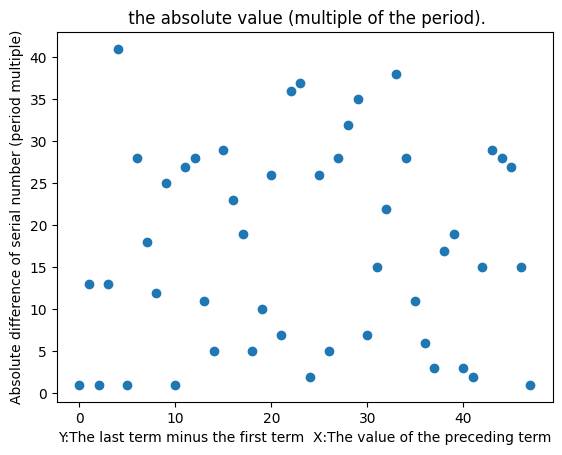

In [27]:
periodsave_filename = "periodsearch.png"
a = []
for k, v in diff_d.items():
    a.append(v)
print(a)
x = list(range(len(a[1:])))
y = a[1:]

# 绘制折线图
print("In order of square variance from smallest to largest, subtract the forward term from the sequence number to get the absolute value (multiple of the period).")
plt.xlabel("Y:The last term minus the first term  X:The value of the preceding term")
plt.ylabel("Absolute difference of serial number (period multiple)")
plt.title(" the absolute value (multiple of the period).")
plt.scatter(x,y )
plt.savefig(data_path + periodsave_filename,dpi=290)

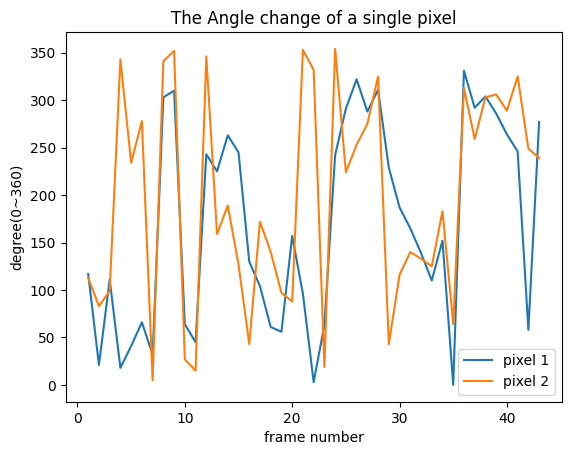

In [28]:
start_row = 1
end_row = 2000
plotangle_savename = "The Angle of 2 pixels varies over time"
with open(data_path + txt_filename , 'r') as f:
    lines = f.readlines()[start_row-1:end_row]

data = [int(num) for num in lines]
#print (data)

group_size = 47
angle1 = []
for i in range(0, len(data),group_size):
        angle1.append(data[i])
        i = i + 123
angle2 = []
for i in range(2, len(data),group_size):
        angle2.append(data[i])

x = list(range(1, len(angle1)+1))
y1 = angle1
y2 = angle2
plt.plot(x, y1,label="pixel 1")
plt.plot(x,y2,label="pixel 2")
plt.title("The Angle change of a single pixel")
plt.xlabel("frame number")
plt.ylabel("degree(0~360)")
plt.legend()
plt.savefig(data_path + plotangle_savename,dpi=300)
plt.show()